In this lab you will do the following steps in order:

1. Explore and Load dataset.
2. Train [faster RCNN](https://towardsdatascience.com/faster-r-cnn-for-object-detection-a-technical-summary-474c5b857b46) for uno cards object detection.
3. Test the network.




Use GPU if available

In [1]:
import torch
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')
DEVICE = torch.device("cuda:0" if train_on_gpu else "cpu")
print(DEVICE)

CUDA is available!  Training on GPU ...
cuda:0


In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import re

1. Explore and Load dataset.

In [3]:
#!gdown "https://drive.google.com/uc?id=13IjqxWIVsP2bgPZP6sE9_VYGXMeu1MWI"
#!unzip -q -n "Uno Cards.v2-raw.voc.zip" -d data

Setup of the training procedure

In [4]:
import torch
BATCH_SIZE = 32 # increase / decrease according to GPU memeory
RESIZE_TO = 416 # resize the image for training and transforms
NUM_EPOCHS = 3 # number of epochs to train for
NUM_WORKERS = 8 
# training images and XML files directory
TRAIN_DIR = '../datasets/uno/train'
# validation images and XML files directory
VALID_DIR = '../datasets/uno/valid'
TEST_DIR = '../datasets/uno/test'
# classes: 0 index is reserved for background
CLASSES = ['__background__','0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14']

NUM_CLASSES = len(CLASSES)
# whether to visualize images after crearing the data loaders
VISUALIZE_TRANSFORMED_IMAGES = True
# location to save model and plots
OUT_DIR = 'outputs'

Utils

In [5]:
from IPython.lib.display import exists
import albumentations as A
import cv2
import numpy as np
import torch
import os
import matplotlib.pyplot as plt
from albumentations.pytorch import ToTensorV2
plt.style.use('ggplot')
# this class keeps track of the training and validation loss values...
# ... and helps to get the average for each epoch as well
class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0
class SaveBestModel:
    """
    Class to save the best model while training. If the current epoch's
    validation loss is less than the previous least less, then save the
    model state.
    """
    def __init__(
        self, best_valid_loss=float('inf')
    ):
        self.best_valid_loss = best_valid_loss

    def __call__(
        self, current_valid_loss,
        epoch, model, optimizer
    ):
        if current_valid_loss < self.best_valid_loss:
            self.best_valid_loss = current_valid_loss
            print(f"\nBest validation loss: {self.best_valid_loss}")
            print(f"\nSaving best model for epoch: {epoch+1}\n")
            os.makedirs("outputs",exist_ok=True)
            torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/best_model.pth')
def collate_fn(batch):
    """
    To handle the data loading as different images may have different number
    of objects and to handle varying size tensors as well.
    """
    return tuple(zip(*batch))
# define the training tranforms
def get_train_transform():
    return A.Compose([
        A.Flip(p=0.5),
        A.RandomRotate90(p=0.5),
        A.MotionBlur(p=0.2),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.Blur(blur_limit=3, p=0.1),
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })
# define the validation transforms
def get_valid_transform():
    return A.Compose([
        ToTensorV2(p=1.0),
    ], bbox_params={
        'format': 'pascal_voc',
        'label_fields': ['labels']
    })
def show_transformed_image(train_loader):
    """
    This function visualizes transformed images from the `train_loader`.

    It helps to verify if the transformations applied to the images and their
    corresponding labels are correct. The function only executes if the flag
    `VISUALIZE_TRANSFORMED_IMAGES` is set to `True` in the configuration file (`config.py`).

    Args:
        train_loader (torch.utils.data.DataLoader): The data loader containing
                                                  transformed training images and labels.
    """

    if len(train_loader) > 0:
        # Iterate over the data loader to get one batch of images and labels
        for i in range(1):
            images, targets = next(iter(train_loader))

            # Move images to the specified device (CPU or GPU)
            images = list(image.to(DEVICE) for image in images)

            # Move labels to the specified device and convert non-string elements to tensors on that device
            targets = [{k: v.to(DEVICE) for k, v in t.items() if not isinstance(v, str)} for t in targets]

            # Extract bounding boxes and labels from the first target in the batch
            boxes = targets[i]['boxes'].cpu().numpy().astype(np.int32)
            labels = targets[i]['labels'].cpu().numpy().astype(np.int32)

            # Get the first image from the batch and convert it to a NumPy array for visualization
            sample = images[i].permute(1, 2, 0).cpu().numpy()

            # Draw bounding boxes and labels on the image
            for box_num, box in enumerate(boxes):
                cv2.rectangle(sample,
                             (box[0], box[1]),  # Top-left corner coordinates
                             (box[2], box[3]),  # Bottom-right corner coordinates
                             (0, 0, 255), 2)    # Red color, thickness 2
                label_text = CLASSES[labels[box_num]]  # Get label text from label index
                cv2.putText(sample, label_text,
                            (box[0], box[1] - 10),  # Position above top-left corner
                            cv2.FONT_HERSHEY_SIMPLEX, 1.0, (0, 0, 255), 2)  # Font style, size, color, thickness

            # Display the image using matplotlib
            plt.imshow(sample)
            plt.axis("off")  # Hide axes for cleaner visualization
            plt.show()

def save_model(epoch, model, optimizer):
    """
    Function to save the trained model till current epoch, or whenver called
    """
    os.makedirs("outputs",exist_ok=True)
    torch.save({
                'epoch': epoch+1,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                }, 'outputs/last_model.pth')
def save_loss_plot(OUT_DIR, train_loss, val_loss):
    figure_1, train_ax = plt.subplots()
    figure_2, valid_ax = plt.subplots()
    train_ax.plot(train_loss, color='tab:blue')
    train_ax.set_xlabel('iterations')
    train_ax.set_ylabel('train loss')
    valid_ax.plot(val_loss, color='tab:red')
    valid_ax.set_xlabel('iterations')
    valid_ax.set_ylabel('validation loss')
    figure_1.savefig(f"{OUT_DIR}/train_loss.png")
    figure_2.savefig(f"{OUT_DIR}/valid_loss.png")
    print('SAVING PLOTS COMPLETE...')
    plt.close('all')

Prepare the dataset

Number of training images: 6295


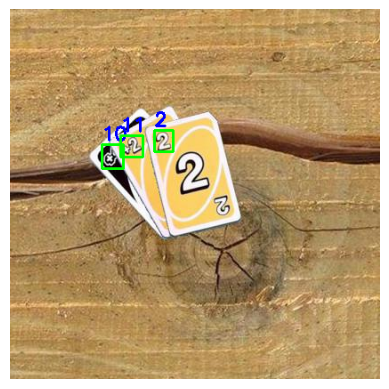

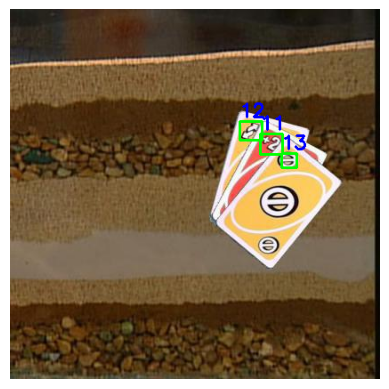

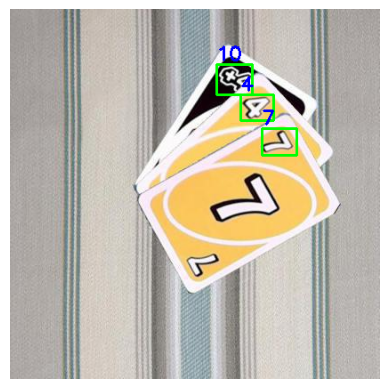

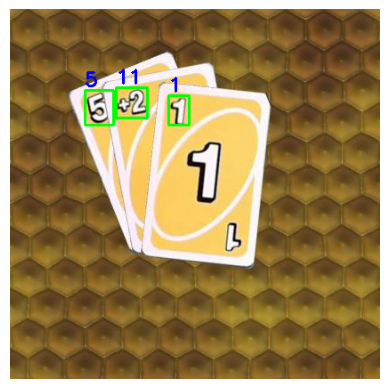

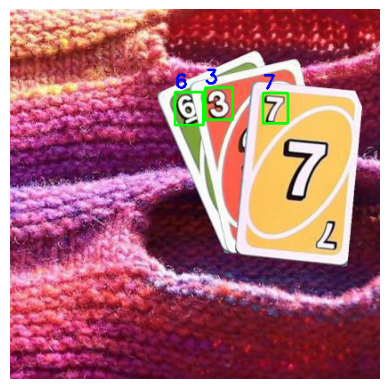

<Figure size 640x480 with 0 Axes>

In [6]:
import torch
import cv2
import numpy as np
import os
import glob as glob
from xml.etree import ElementTree as et
from torch.utils.data import Dataset, DataLoader
# the dataset class
class CustomDataset(Dataset):
    def __init__(self, dir_path, width, height, classes, transforms=None):
        self.transforms = transforms
        self.dir_path = dir_path
        self.height = height
        self.width = width
        self.classes = classes

        # get all the image paths in sorted order
        self.image_paths = glob.glob(f"{self.dir_path}/*.jpg")
        self.all_images = [image_path.split(os.path.sep)[-1] for image_path in self.image_paths]
        self.all_images = sorted(self.all_images)

    def __getitem__(self, idx):
        # capture the image name and the full image path
        image_name = self.all_images[idx]
        image_path = os.path.join(self.dir_path, image_name)
        # read the image
        image = cv2.imread(image_path)
        # convert BGR to RGB color format
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image_resized = cv2.resize(image, (self.width, self.height))
        image_resized /= 255.0

        # capture the corresponding XML file for getting the annotations
        annot_filename = image_name[:-4] + '.xml'
        annot_file_path = os.path.join(self.dir_path, annot_filename)

        boxes = []
        labels = []
        tree = et.parse(annot_file_path)
        root = tree.getroot()

        # get the height and width of the image
        image_width = image.shape[1]
        image_height = image.shape[0]

        # box coordinates for xml files are extracted and corrected for image size given
        for member in root.findall('object'):
            # map the current object name to `classes` list to get...
            # ... the label index and append to `labels` list
            labels.append(self.classes.index(member.find('name').text))

            # xmin = left corner x-coordinates
            xmin = int(member.find('bndbox').find('xmin').text)
            # xmax = right corner x-coordinates
            xmax = int(member.find('bndbox').find('xmax').text)
            # ymin = left corner y-coordinates
            ymin = int(member.find('bndbox').find('ymin').text)
            # ymax = right corner y-coordinates
            ymax = int(member.find('bndbox').find('ymax').text)

            # resize the bounding boxes according to the desired `width`, `height`
            xmin_final = (xmin/image_width)*self.width
            xmax_final = (xmax/image_width)*self.width
            ymin_final = (ymin/image_height)*self.height
            yamx_final = (ymax/image_height)*self.height
            boxes.append([xmin_final, ymin_final, xmax_final, yamx_final])

        # bounding box to tensor
        boxes = torch.as_tensor(boxes, dtype=torch.float32)
        # area of the bounding boxes
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        # no crowd instances
        iscrowd = torch.zeros((boxes.shape[0],), dtype=torch.int64)
        # labels to tensor
        labels = torch.as_tensor(labels, dtype=torch.int64)
        # prepare the final `target` dictionary
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["area"] = area
        target["iscrowd"] = iscrowd
        image_id = torch.tensor([idx])
        target["image_id"] = image_id
        target["name"]=image_name
        # apply the image transforms
        if self.transforms:
            sample = self.transforms(image = image_resized,
                                     bboxes = target['boxes'],
                                     labels = labels)
            image_resized = sample['image']
            target['boxes'] = torch.Tensor(sample['bboxes'])

        return image_resized, target

    def __len__(self):
        return len(self.all_images)

# prepare the final datasets and data loaders
def create_train_dataset():
    train_dataset = CustomDataset(TRAIN_DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_train_transform())
    return train_dataset
def create_valid_dataset():
    valid_dataset = CustomDataset(VALID_DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform())
    return valid_dataset
def create_test_dataset():
    valid_dataset = CustomDataset(TEST_DIR, RESIZE_TO, RESIZE_TO, CLASSES, get_valid_transform())
    return valid_dataset
def create_train_loader(train_dataset, num_workers=0):
    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=True,
        num_workers=num_workers,
        collate_fn=collate_fn
    )
    return train_loader
def create_valid_loader(valid_dataset, num_workers=0, batch_size=BATCH_SIZE):
    valid_loader = DataLoader(
        valid_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=num_workers,
        collate_fn=collate_fn
    )
    return valid_loader

dataset = CustomDataset(
    TRAIN_DIR, RESIZE_TO, RESIZE_TO, CLASSES
)
print(f"Number of training images: {len(dataset)}")

# function to visualize a single sample
def visualize_sample(image, target):
    image=image*255
    for box_num in range(len(target['boxes'])):
        box = target['boxes'][box_num]
        label = CLASSES[target['labels'][box_num]]
        cv2.rectangle(
            image,
            (int(box[0]), int(box[1])), (int(box[2]), int(box[3])),
            (0, 255, 0), 2
        )
        cv2.putText(
            image, label, (int(box[0]), int(box[1]-5)),
            cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2
        )
    image=image.astype(np.uint8)
    plt.imshow(image)
    plt.axis("off")
    plt.show()
    plt.figure()
NUM_SAMPLES_TO_VISUALIZE = 5
for i in range(NUM_SAMPLES_TO_VISUALIZE):
    image, target = dataset[i]
    visualize_sample(image, target)

Model setup. [Faster-rcnn](https://pytorch.org/vision/main/models/generated/torchvision.models.detection.fasterrcnn_resnet50_fpn.html?highlight=fasterrcnn_resnet50_fpn)

In [7]:
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
def create_model(num_classes):

    # load Faster RCNN pre-trained model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

    # get the number of input features
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # define a new head for the detector with required number of classes
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

/home/omirako/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2. Train and validate


In [8]:
import torch
import matplotlib.pyplot as plt
import time
from tqdm.auto import tqdm
plt.style.use('ggplot')

def train(train_data_loader, model):


    print('Training')

    global train_itr
    global train_loss_list

    # Initialize tqdm progress bar for training loop visualization
    prog_bar = tqdm(train_data_loader, total=len(train_data_loader))

    for i, data in enumerate(prog_bar):
        
        optimizer.zero_grad()
        images, targets = data
        images = list(image.to(DEVICE) for image in images)

        # Move targets to the specified device and convert non-string elements to tensors on that device
        targets = [{k: v.to(DEVICE) for k, v in t.items() if not isinstance(v, str)} for t in targets]
        
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        train_loss_list.append(loss_value)

        losses.backward()
        optimizer.step()
        train_itr += 1

        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")

    return train_loss_list


def validate(valid_data_loader, model):

    print('Validating')

    global val_itr  
    global val_loss_list

    prog_bar = tqdm(valid_data_loader, total=len(valid_data_loader))

    for i, data in enumerate(prog_bar):
        images, targets = data
        images = list(image.to(DEVICE) for image in images)

        # Move targets to the specified device and convert non-string elements to tensors on that device
        targets = [{k: v.to(DEVICE) for k, v in t.items() if not isinstance(v, str)} for t in targets]

        with torch.no_grad():
            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())
            loss_value = losses.item()
            val_loss_list.append(loss_value)
            val_loss_hist.send(loss_value) 

            val_itr += 1
        prog_bar.set_description(desc=f"Loss: {loss_value:.4f}")

    return val_loss_list

Training code

Number of training samples: 6295
Number of validation samples: 1798

Number of test samples: 899



/home/omirako/.local/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/omirako/.local/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


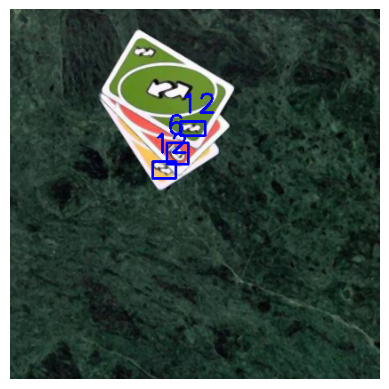

In [9]:
if __name__ == '__main__':
    train_dataset = create_train_dataset()
    valid_dataset = create_valid_dataset()
    test_dataset = create_test_dataset()
    train_loader = create_train_loader(train_dataset, NUM_WORKERS)
    valid_loader = create_valid_loader(valid_dataset, NUM_WORKERS)
    test_loader = create_valid_loader(test_dataset, NUM_WORKERS, batch_size=1)
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(valid_dataset)}\n")
    print(f"Number of test samples: {len(test_dataset)}\n")
    # initialize the model and move to the computation device
    model = create_model(num_classes=NUM_CLASSES)
    model = model.to(DEVICE)
    # get the model parameters
    params = [p for p in model.parameters() if p.requires_grad]
    # define the optimizer
    optimizer = torch.optim.Adam(params, lr=0.0001)
    # initialize the Averager class
    train_loss_hist = Averager()
    val_loss_hist = Averager()
    train_itr = 1
    val_itr = 1
    train_loss_list = []
    val_loss_list = []
    # name to save the trained model with
    MODEL_NAME = 'model'
    # whether to show transformed images from data loader or not
    if VISUALIZE_TRANSFORMED_IMAGES:
        show_transformed_image(train_loader)
    # initialize SaveBestModel class
    save_best_model = SaveBestModel()
    # start the training epochs
    


In [10]:
    # for epoch in range(NUM_EPOCHS):
    #     print(f"\nEPOCH {epoch+1} of {NUM_EPOCHS}")
    #     # reset the training and validation loss histories for the current epoch
    #     train_loss_hist.reset()
    #     val_loss_hist.reset()
    #     # start timer and carry out training and validation
    #     start = time.time()
    #     train_loss = train(train_loader, model)
    #     val_loss = validate(valid_loader, model)
    #     print(f"Epoch #{epoch+1} train loss: {train_loss_hist.value:.3f}")
    #     print(f"Epoch #{epoch+1} validation loss: {val_loss_hist.value:.3f}")
    #     end = time.time()
    #     print(f"Took {((end - start) / 60):.3f} minutes for epoch {epoch}")
    #     # save the best model till now if we have the least loss in the      # ... current epoch
    #     save_best_model(
    #         val_loss_hist.value, epoch, model, optimizer
    #     )
    #     # save the current epoch model
    #     save_model(epoch, model, optimizer)
    #     # save loss plot
    #     save_loss_plot(OUT_DIR, train_loss, val_loss)

    #     # sleep for 5 seconds after each epoch
    #     time.sleep(5)

Test the network

In [40]:
import numpy as np
import cv2
import torch
import glob as glob
import os
import time
from copy import copy
from tqdm import tqdm

# load the best model and trained weights
model = create_model(num_classes=NUM_CLASSES)
checkpoint = torch.load('../datasets/uno/outputs/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()
# define the detection threshold...
# ... any detection having score below this will be discarded
detection_threshold = 0.8
# to count the total number of images iterated through
frame_count = 0
# to keep adding the FPS for each image
total_fps = 0
os.makedirs("inference_outputs/images",exist_ok=True)
# initialize tqdm progress bar
# prog_bar = tqdm(test_loader, total=len(test_loader))
# print(len(test_loader))

for data in tqdm(test_dataset):
    image, target = data
    orig_image = np.array(image).transpose(1,2,0)
    image=image.to(DEVICE)

    # get the image file name for saving output later on
    image_name = target["name"]
    bbox=target["boxes"]
    # print(image_name,target)

    # add batch dimension
    image = torch.unsqueeze(image, 0)
    start_time = time.time()
    with torch.no_grad():
        outputs = model(image.to(DEVICE))
    end_time = time.time()
    # get the current fps
    fps = 1 / (end_time - start_time)
    # add `fps` to `total_fps`
    total_fps += fps
    # increment frame count
    frame_count += 1
    # load all detection to CPU for further operations
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    # carry further only if there are detected boxes
    # Check if there are any detected bounding boxes
    if len(outputs[0]['boxes']) != 0:
        # Get boxes and scores from the output dictionary
        boxes = outputs[0]['boxes'].data.numpy()
        scores = outputs[0]['scores'].data.numpy()

        # Filter boxes based on a detection threshold (confidence score)
        boxes = boxes[scores >= detection_threshold].astype(np.int32)
        draw_boxes = boxes.copy()  # Copy boxes for drawing

        # Get predicted class names based on class indices
        pred_classes = [CLASSES[i] for i in outputs[0]['labels'].cpu().numpy()]

        # Loop through detected bounding boxes and draw them on the image
        for j, box in enumerate(draw_boxes):
            class_name = pred_classes[j]

            # Draw a green rectangle around the bounding box
            cv2.rectangle(orig_image, (int(box[0]), int(box[1])),
                        (int(box[2]), int(box[3])), (0, 255, 0), 2)

            # Write the predicted class name above the bounding box
            cv2.putText(orig_image, class_name, (int(box[0]), int(box[1] - 5)),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)

        # Display the image with bounding boxes and class names using matplotlib
        # plt.imshow(orig_image)
        # plt.axis("off")

        # Save the image with bounding boxes to a specified directory
        # plt.savefig(f"inference_outputs/images/{image_name}.jpg", bbox_inches="tight",pad_inches=0)
        
        with open(f"../datasets/uno/inference_outputs/images/{image_name}.txt", 'w') as f:
            for j, box in enumerate(draw_boxes):
                f.write(f"{pred_classes[j]} {scores[j]} {box[0]} {box[1]} {box[2]} {box[3]}\n")
        
        # plt.show()
        cv2.imwrite(f"../datasets/uno/inference_outputs/images/{image_name}.jpg", np.uint8(orig_image[:,:,::-1]*255))
        # Create a new figure for potentially further plotting needs
        # plt.figure()

print('TEST PREDICTIONS COMPLETE')

# Close any open OpenCV windows
#cv2.destroyAllWindows()

# Calculate and print the average FPS
avg_fps = total_fps / frame_count
print(f"Average FPS: {avg_fps:.3f}")


/home/omirako/.local/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/omirako/.local/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 899/899 [00:28<00:00, 31.39it/s]

TEST PREDICTIONS COMPLETE
Average FPS: 42.837


In [41]:
# calculate the intersection over union (IoU) of two bounding boxes

def box_area(box):
    return (box[2] - box[0] + 1) * (box[3] - box[1] + 1)

def intersection(boxA, boxB):
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)

    return interArea

def intersection_over_union(boxA, boxB):
    interArea = intersection(boxA, boxB)

    iou = interArea / float(box_area(boxA) + box_area(boxB) - interArea)

    return iou


ground_truth_files = glob.glob("../datasets/uno/test/*.xml")
prediction_files = glob.glob("../datasets/uno/inference_outputs/images/*.txt")


ground_truth_boxes = []
predicted_boxes = []

# loop over the ground-truth files
for file in ground_truth_files:
    
    tree = et.parse(file)
    root = tree.getroot()

    image_name = root.find('filename').text

    for obj in root.findall('object'):
        label = obj.find('name').text
        xmin = int(obj.find('bndbox').find('xmin').text)
        ymin = int(obj.find('bndbox').find('ymin').text)
        xmax = int(obj.find('bndbox').find('xmax').text)
        ymax = int(obj.find('bndbox').find('ymax').text)

        ground_truth_boxes.append({
            "image_name": image_name,
            "label": label,
            "box": [xmin, ymin, xmax, ymax]
        })

# loop over the prediction files
for file in prediction_files:
    with open(file, "r") as f:
        lines = f.readlines()
        
        image_name = file.split(os.path.sep)[-1].split(".txt")[0]
        
        for line in lines:
            
            label, conf, xmin, ymin, xmax, ymax = line.strip().split(" ")
            xmin, ymin, xmax, ymax = map(int, [xmin, ymin, xmax, ymax])

            predicted_boxes.append({
                "image_name": image_name,
                "label": label,
                "conf": float(conf),
                "box": [xmin, ymin, xmax, ymax]
            })

            
predicted_boxes = sorted(predicted_boxes, key=lambda x: x["conf"], reverse=True)
# print (predicted_boxes)

tp = []
fp = []
fn = []


tp_threshold = 0.8
ious_total = {}
# print(len(ground_truth_boxes))
for prediction in predicted_boxes:
        
    image_name = prediction["image_name"]
    label = prediction["label"]
    box = prediction["box"]
    # print(f"Looking for {image_name} and {label}")
    filtered_gt = [gt for gt in filter(lambda gt: gt["image_name"] == image_name and gt["label"] == label, ground_truth_boxes)]

    ious = [intersection_over_union(box, gt["box"]) for gt in filtered_gt]
    
    tp_areas = [intersection(box, gt["box"]) for gt in filtered_gt]
    
    fp_areas = [(box_area(box) - tp_areas[idx]) for idx, gt in enumerate(filtered_gt)]
    
    fn_areas = [(box_area(gt["box"]) - tp_areas[idx]) for idx, gt in enumerate(filtered_gt)]
    
    union_areas = [box_area(box) + box_area(gt["box"]) - tp_areas[idx] for idx, gt in enumerate(filtered_gt)]

    tp_areas_norm = [tp_areas[idx] / union_areas[idx] for idx in range(len(union_areas))] # IoU
    fp_areas_norm = [fp_areas[idx] / union_areas[idx] for idx in range(len(union_areas))]
    fn_areas_norm = [fn_areas[idx] / union_areas[idx] for idx in range(len(union_areas))]
                     
    ious_total[(image_name, label)] = [tp_areas_norm, fp_areas_norm, fn_areas_norm]
    
        

for key, value in ious_total.items():
    tp_areas_norm, fp_areas_norm, fn_areas_norm = value
    for idx in range(len(tp_areas_norm)):
        if tp_areas_norm[idx] >= tp_threshold:
            tp.append(1)
        elif fp_areas_norm[idx] >= fn_areas_norm[idx]:
            fp.append(1)
        else:
            fn.append(1)
        
            


print(f"True Positives: {sum(tp)}")
print(f"False Positives: {sum(fp)}")
print(f"False Negatives: {sum(fn)}")

precision = sum(tp) / (sum(tp) + sum(fp))
recall = sum(tp) / (sum(tp) + sum(fn))
f1 = 2 * precision * recall / (precision + recall)

print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1 Score: {f1:.2f}")


True Positives: 2380
False Positives: 167
False Negatives: 143
Precision: 0.93
Recall: 0.94
F1 Score: 0.94


In [42]:
ious_total_l = sorted(ious_total.items(), key=lambda x: x[1], reverse=True)
ious_total_l

[(('024867974_jpg.rf.922a687745ea8413640088bfe4bc2e4a.jpg', '11'),
  [[1.0], [0.0], [0.0]]),
 (('852115519_jpg.rf.84543cf544126c59848dbf0e4a46a2bd.jpg', '1'),
  [[1.0], [0.0], [0.0]]),
 (('061535026_jpg.rf.3d646de51d3aaaf51780c7180ec81055.jpg', '4'),
  [[1.0], [0.0], [0.0]]),
 (('328577380_jpg.rf.bb53edb38332ad81d4810828bb9a2de6.jpg', '1'),
  [[1.0], [0.0], [0.0]]),
 (('398560473_jpg.rf.2c21e0a6771a7ceb149b46fd306a377b.jpg', '4'),
  [[1.0], [0.0], [0.0]]),
 (('461251416_jpg.rf.f1efd74907ac5448ebfc682d2b86db60.jpg', '1'),
  [[1.0], [0.0], [0.0]]),
 (('120647614_jpg.rf.7c7790bceb5f19028d96b040a0c87c2c.jpg', '12'),
  [[1.0], [0.0], [0.0]]),
 (('677977647_jpg.rf.8eabfcd6b6c6f4f1e552de817a012c8e.jpg', '0'),
  [[1.0], [0.0], [0.0]]),
 (('656962142_jpg.rf.d7d35d97a6be42bccfcf7aae2fadd05e.jpg', '6'),
  [[1.0], [0.0], [0.0]]),
 (('950806711_jpg.rf.562a7e97ca3b49696bff39efd65c48fb.jpg', '4'),
  [[1.0], [0.0], [0.0]]),
 (('430215546_jpg.rf.37406cbed35c10b51c451e7383ce52c6.jpg', '6'),
  [[1.0], [0

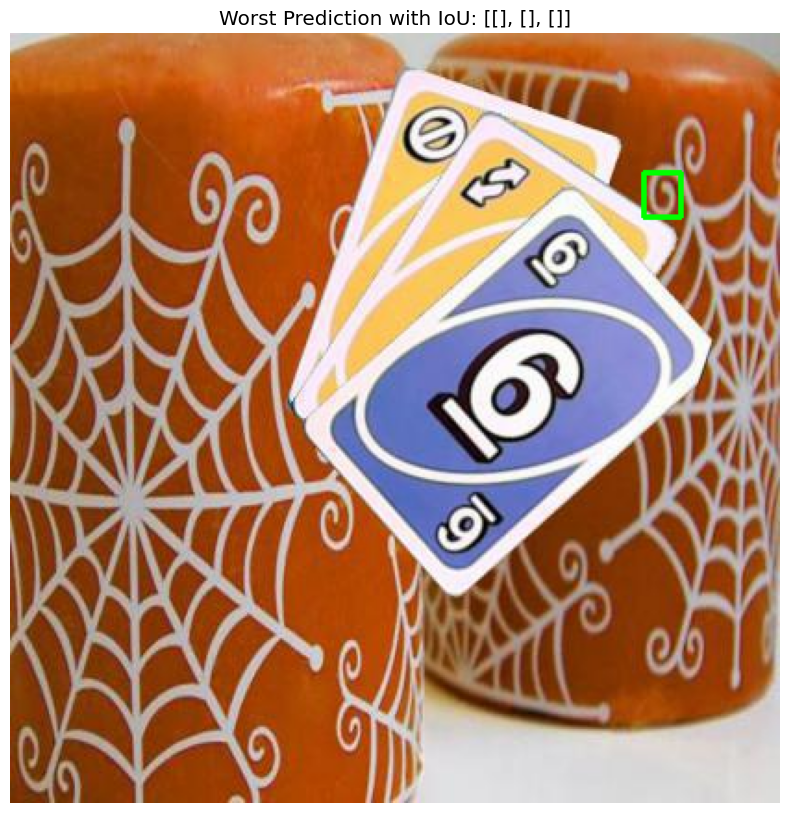

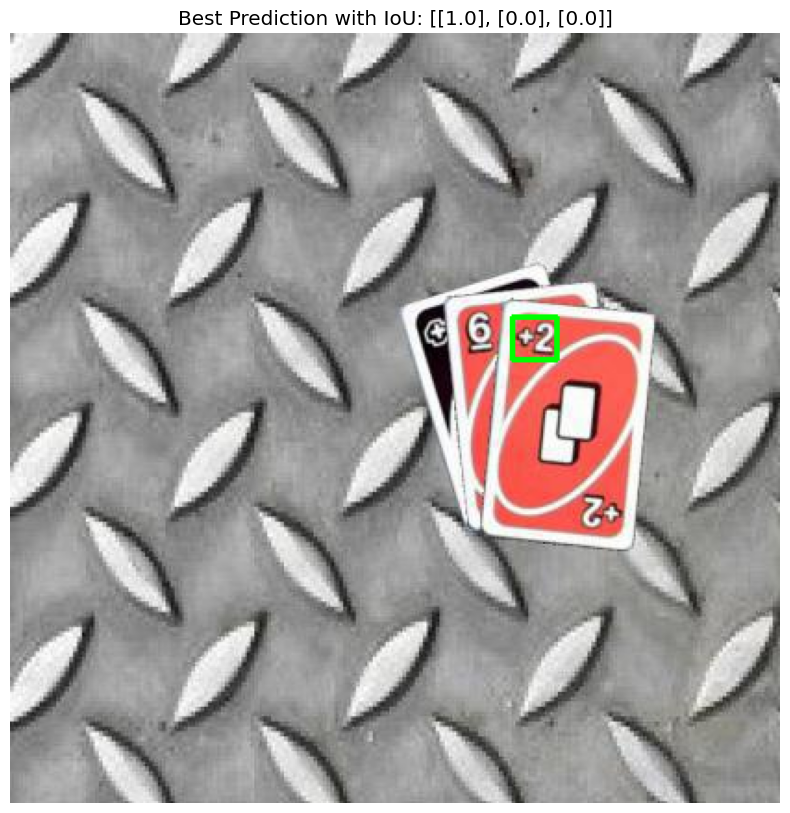

In [71]:
def show_image(image_name, boxes, title):
    image = cv2.imread(f"../datasets/uno/test/{image_name}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (416, 416))
    for box in boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(title)
    plt.axis("off")
    plt.show()
    
def show_image_gt(image_name, pred_boxes, gt_boxes, title):
    image = cv2.imread(f"../datasets/uno/test/{image_name}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (416, 416))
    for box in pred_boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)
    for box in gt_boxes:
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (255, 0, 0), 2)
    
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.title(title)
    plt.axis("off")
    plt.show()
    
best_prediction = ious_total_l[0]
worst_prediction = ious_total_l[-1]

best_image_name = best_prediction[0][0]
worst_image_name = worst_prediction[0][0]

best_label = best_prediction[0][1]
worst_label = worst_prediction[0][1]


gt_worst = [gt["box"] for gt in ground_truth_boxes if gt["image_name"] == worst_image_name and gt["label"] == worst_label]
gt_best = [gt["box"] for gt in ground_truth_boxes if gt["image_name"] == best_image_name and gt["label"] == best_label]

pred_worst = [prediction["box"] for prediction in predicted_boxes if prediction["image_name"] == worst_image_name and prediction["label"] == worst_label]
pred_best = [prediction["box"] for prediction in predicted_boxes if prediction["image_name"] == best_image_name and prediction["label"] == best_label]

show_image(worst_image_name, gt_worst + pred_worst, f"Worst Prediction with IoU: {worst_prediction[1]}")
show_image(best_image_name, gt_best + pred_best, f"Best Prediction with IoU: {best_prediction[1]}")



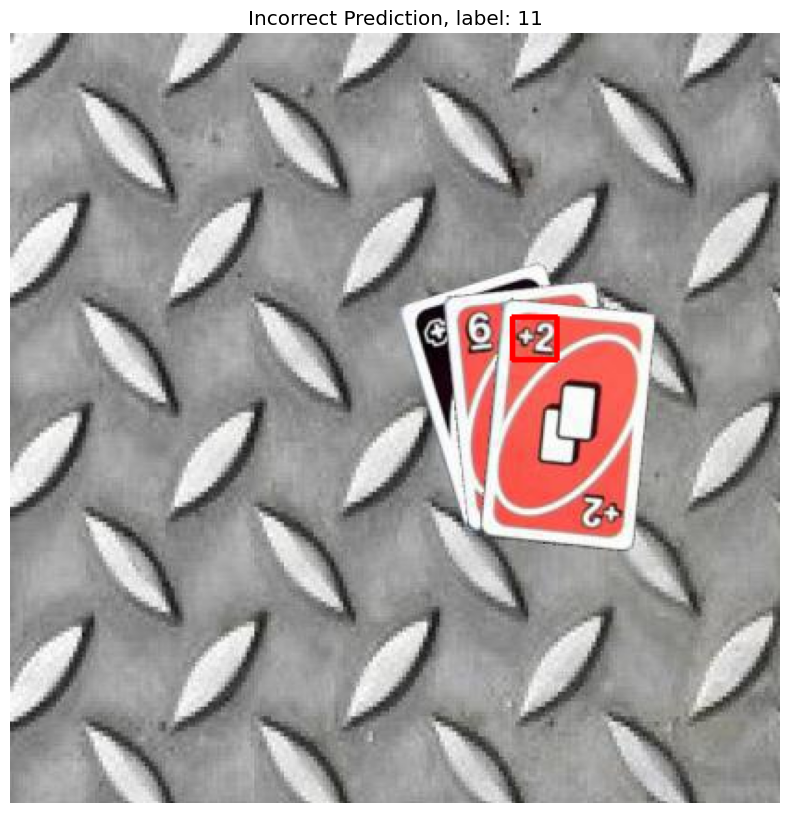

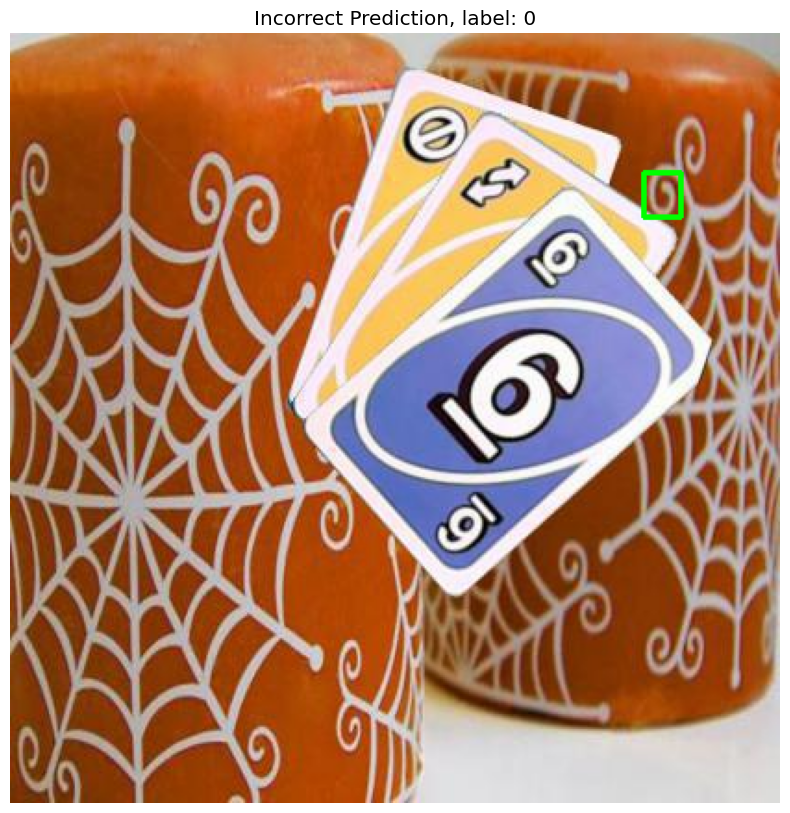

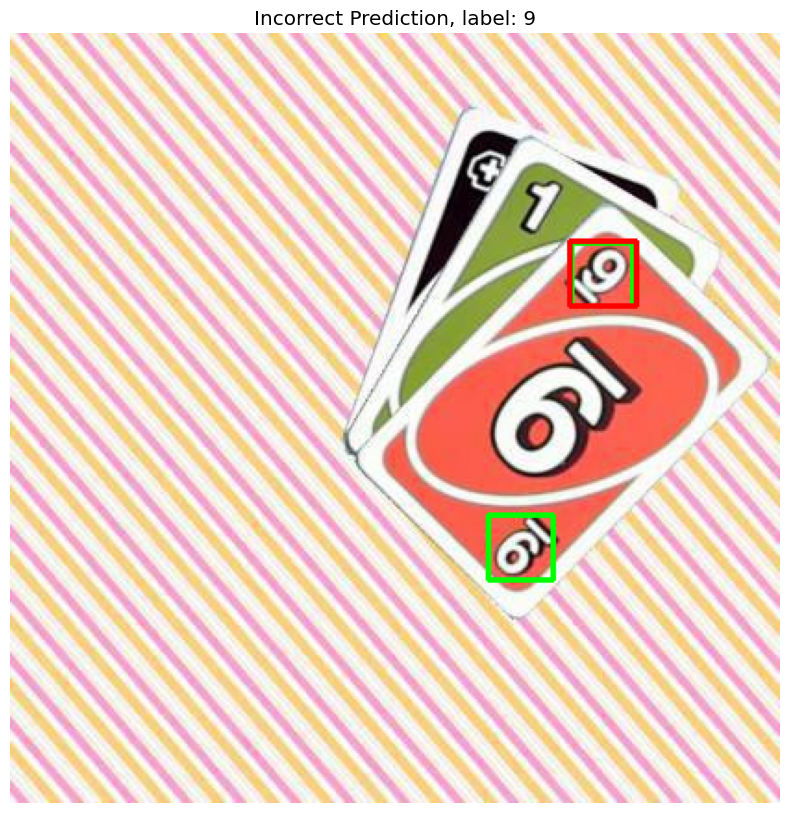

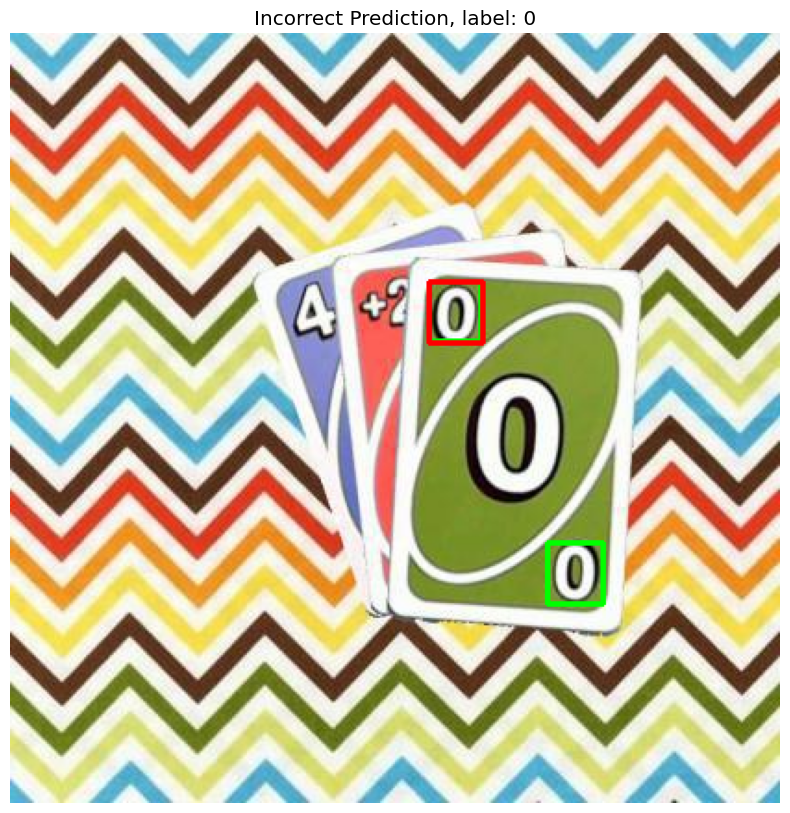

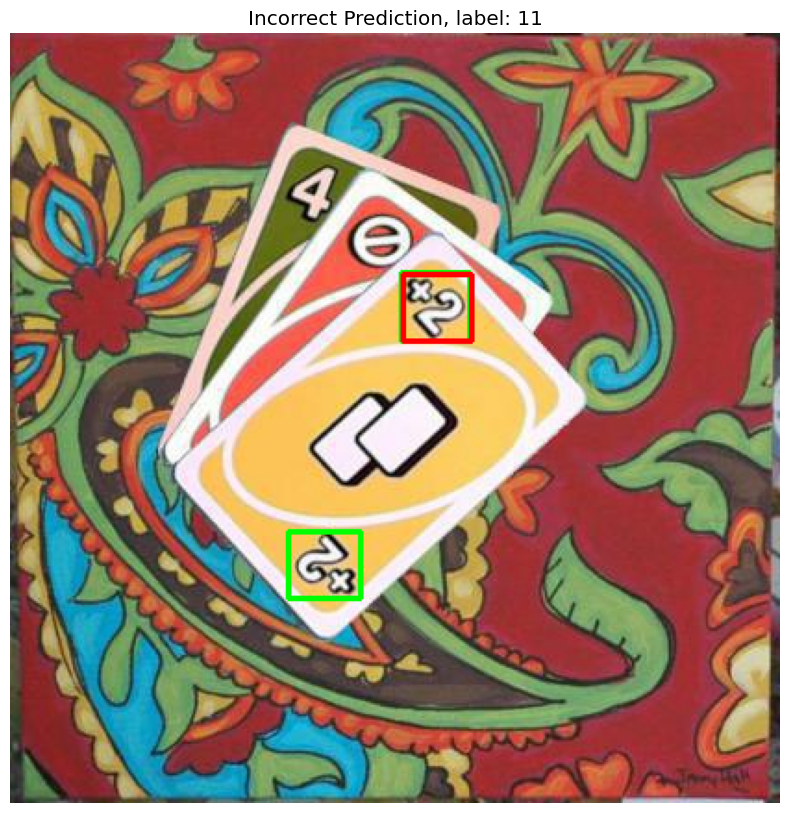

In [73]:
# print worst 5 predictions

for i in range(5):
    prediction = ious_total_l[-i]
    image_name = prediction[0][0]
    label = prediction[0][1]
    gt_boxes = [gt["box"] for gt in ground_truth_boxes if gt["image_name"] == image_name and gt["label"] == label]
    pred_boxes = [prediction["box"] for prediction in predicted_boxes if prediction["image_name"] == image_name and prediction["label"] == label]
    show_image_gt(image_name, pred_boxes, gt_boxes, f"Incorrect Prediction, label: {label}")
    

**ASSIGNMENT**

Display some images in the test set with the highest and lowest Intersection over Union (IoU) scores. Additionally, attempt to provide insights into why the model may encounter difficulties in detecting certain images.

In [44]:
label_ious = [[] for _ in CLASSES[1:]]
label_fp = [[] for _ in CLASSES[1:]]
label_fn = [[] for _ in CLASSES[1:]]
for label in CLASSES[1:]:
    for key, values in ious_total.items():
        if key[1] == label:
            for idx in range(len(values[0])):
                label_ious[int(label)].append(values[0][idx])
                label_fp[int(label)].append(values[1][idx])
                label_fn[int(label)].append(values[2][idx])

print(*label_ious)
print(*label_fp)
print(*label_fn)


[0.9214743589743589, 0.0, 0.8780487804878049, 0.9130434782608695, 0.0, 0.9214743589743589, 0.9259259259259259, 0.01832208293153327, 0.8429319371727748, 0.8543833580980683, 0.9156193895870736, 0.8473684210526315, 0.8780487804878049, 0.8394160583941606, 0.8780487804878049, 0.9147727272727273, 0.9198606271777003, 0.8859784283513097, 0.8814691151919867, 0.9130434782608695, 0.9090909090909091, 0.0, 0.8780487804878049, 1.0, 0.9629629629629629, 0.8860353130016051, 0.06527651858567543, 0.8571428571428571, 0.8860353130016051, 0.8814691151919867, 0.9230769230769231, 0.9090909090909091, 0.9126984126984127, 0.8518518518518519, 0.8846153846153846, 0.9103139013452914, 0.8429319371727748, 0.9147540983606557, 0.8711566617862372, 0.9259259259259259, 0.9408602150537635, 0.9088319088319088, 0.9147540983606557, 0.9418402777777778, 0.0, 0.945046439628483, 0.972972972972973, 0.912962962962963, 0.8888888888888888, 0.8780487804878049, 0.8850987432675045, 0.96, 0.822429906542056, 0.8545994065281899, 0.92105263

In [45]:
# average them
label_ious_avg = [np.mean(ious) for ious in label_ious]
label_ious_std = [np.std(ious) for ious in label_ious]
label_fp_avg = [np.mean(fp) for fp in label_fp]
label_fp_std = [np.std(fp) for fp in label_fp]
label_fn_avg = [np.mean(fn) for fn in label_fn]
label_fn_std = [np.std(fn) for fn in label_fn]
len(label_ious_avg), len(label_fp_avg), len(label_fn_avg)

(15, 15, 15)

In [46]:
import seaborn as sns
colors = sns.color_palette("deep6", len(values))  # "husl" is a nice palette

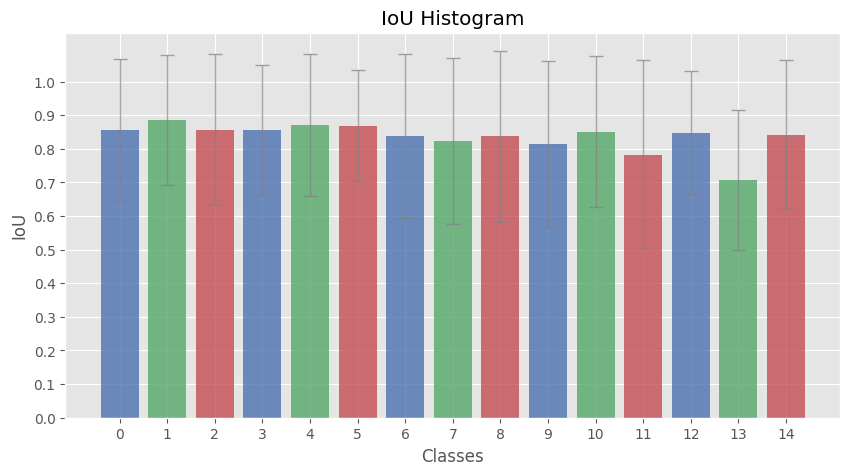

In [47]:
plt.figure(figsize=(10, 5))
bars = plt.bar(CLASSES[1:], label_ious_avg, alpha=0.8, label="IoU", color=colors)
plt.title("IoU Histogram")
plt.xlabel("Classes")
plt.ylabel("IoU")
plt.yticks(np.arange(0, 1.1, 0.1))

bar_centers = [bar.get_x() + bar.get_width() / 2 for bar in bars]
bar_heights = [bar.get_height() for bar in bars]
for center, height, std in zip(bar_centers, bar_heights, label_ious_std):
    plt.errorbar(center, height, yerr=std, capsize=5,
                 color='gray', alpha=0.7, elinewidth=1, capthick=1)

plt.show()

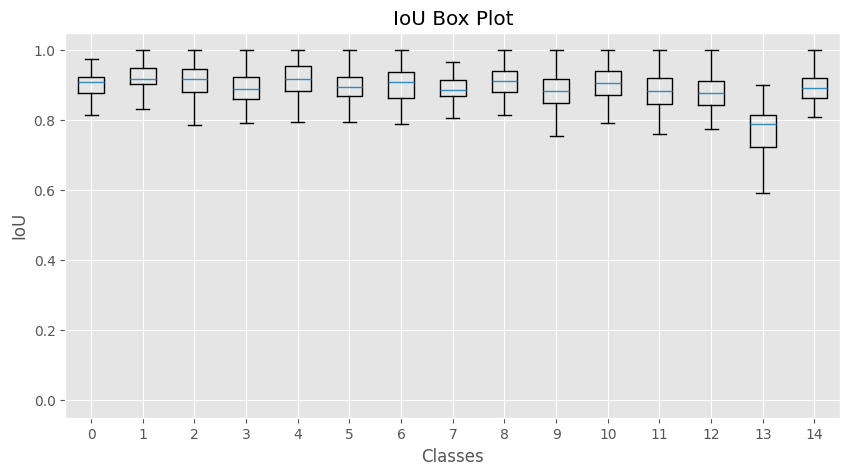

In [48]:
# box plot iou
plt.figure(figsize=(10, 5))
plt.boxplot(label_ious, labels=CLASSES[1:], flierprops=dict(marker=''))
plt.title("IoU Box Plot")
plt.xlabel("Classes")
plt.ylabel("IoU")
plt.show()

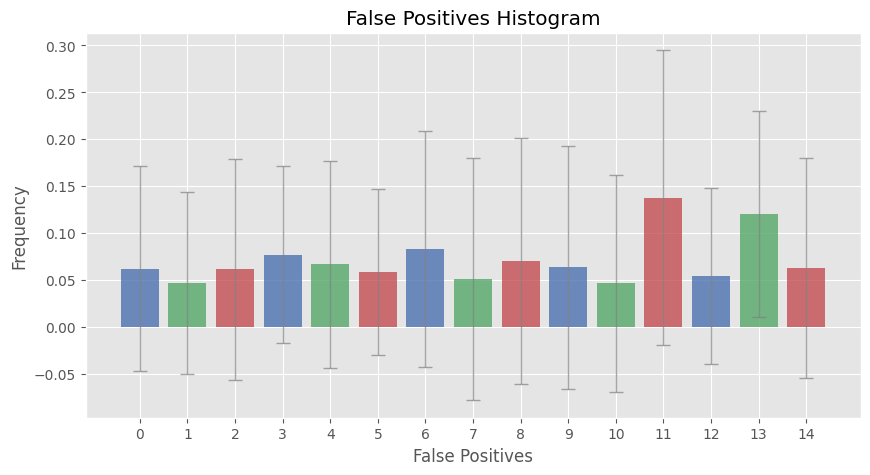

In [49]:
# Plot False Positives
plt.figure(figsize=(10, 5))
bars = plt.bar(CLASSES[1:], label_fp_avg, alpha=0.8, label="IoU", color=colors)
plt.title("False Positives Histogram")
plt.xlabel("False Positives")
plt.ylabel("Frequency")
# plt.yticks(np.arange(0, 0.15, 0.01))

bar_centers = [bar.get_x() + bar.get_width() / 2 for bar in bars]
bar_heights = [bar.get_height() for bar in bars]
for center, height, std in zip(bar_centers, bar_heights, label_fp_std):
    plt.errorbar(center, height, yerr=std, capsize=5,
                 color='gray', alpha=0.7, elinewidth=1, capthick=1)
plt.show()

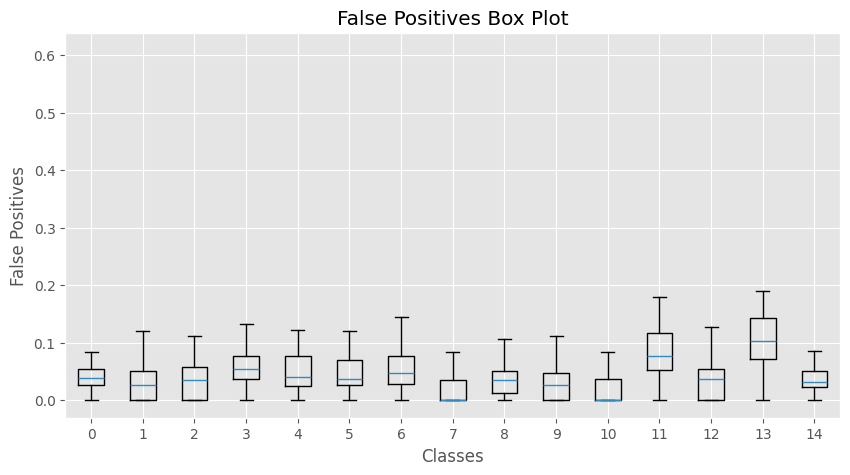

In [50]:
# box plot false positives
plt.figure(figsize=(10, 5))
plt.boxplot(label_fp, labels=CLASSES[1:], flierprops=dict(marker=''))
plt.title("False Positives Box Plot")
plt.xlabel("Classes")
plt.ylabel("False Positives")
plt.show()


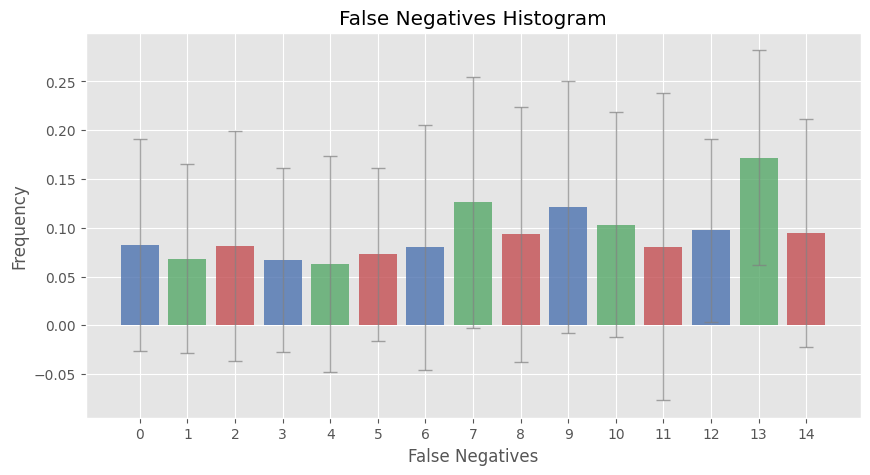

In [51]:
# Plot False Negatives
plt.figure(figsize=(10, 5))
bars = plt.bar(CLASSES[1:], label_fn_avg, alpha=0.8, label="IoU", color=colors)
plt.title("False Negatives Histogram")
plt.xlabel("False Negatives")
plt.ylabel("Frequency")
# plt.yticks(np.arange(0, 0.22, 0.02))

bar_centers = [bar.get_x() + bar.get_width() / 2 for bar in bars]
bar_heights = [bar.get_height() for bar in bars]
for center, height, std in zip(bar_centers, bar_heights, label_fp_std):
    plt.errorbar(center, height, yerr=std, capsize=5,
                 color='gray', alpha=0.7, elinewidth=1, capthick=1)
plt.show()


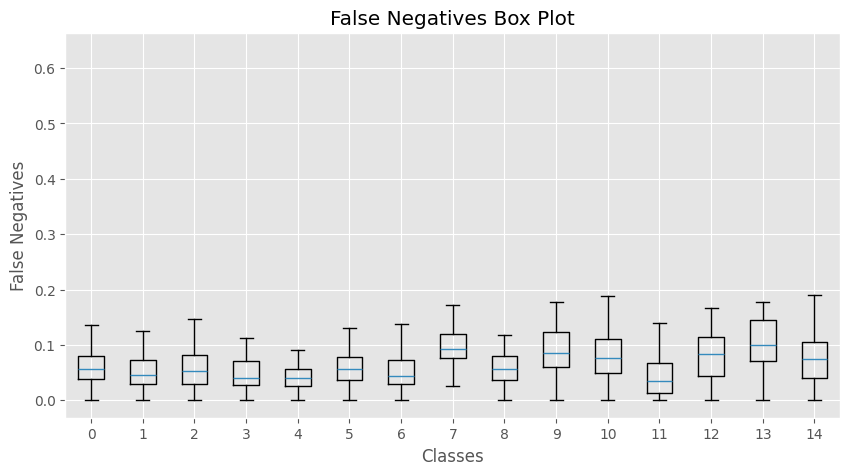

In [52]:
# box plot false negatives
plt.figure(figsize=(10, 5))
plt.boxplot(label_fn, labels=CLASSES[1:], flierprops=dict(marker=''))
plt.title("False Negatives Box Plot")
plt.xlabel("Classes")
plt.ylabel("False Negatives")
plt.show()